# Introduction

In [2]:
import torch
import numpy as np

# Create a tensor in Pytorch
data = [1, 2, 3]
data = torch.tensor(data)
print(data)

# Create a 3x3 tensor with random values between 0 and 1
data = torch.rand(3, 3)
print(data)

# From a Numpy array
data = np.array([1, 2, 3])
data = torch.from_numpy(data)
print(data)

# Create a 3x3 tensor with values sampled from a standard normal distribution
data = torch.randn(3, 3)
print(data)

tensor([1, 2, 3])
tensor([[0.6113, 0.6544, 0.7863],
        [0.4959, 0.9664, 0.9957],
        [0.4329, 0.0403, 0.3183]])
tensor([1, 2, 3])
tensor([[ 0.3592, -0.4679,  0.6648],
        [ 0.5196,  0.2564, -1.7609],
        [-2.8046, -0.6804,  0.1928]])


In [3]:
# Using the arange function
data = torch.arange(start=0, end=4, step=1)
print(data)

tensor([0, 1, 2, 3])


In [4]:
# Broadcasting
tensor1 = torch.tensor([[1, 2],
                        [3, 4]])
tensor2 = torch.tensor([1])

print(f'Tensor1:\n {tensor1}')
print(f'Tensor2:\n {tensor2}')

# Addition between two tensors
tensor3 = tensor1 + tensor2
print(f'Tensor3:\n {tensor3}')

tensor4 = tensor1 + 2
print(f'Tensor4:\n {tensor4}')

Tensor1:
 tensor([[1, 2],
        [3, 4]])
Tensor2:
 tensor([1])
Tensor3:
 tensor([[2, 3],
        [4, 5]])
Tensor4:
 tensor([[3, 4],
        [5, 6]])


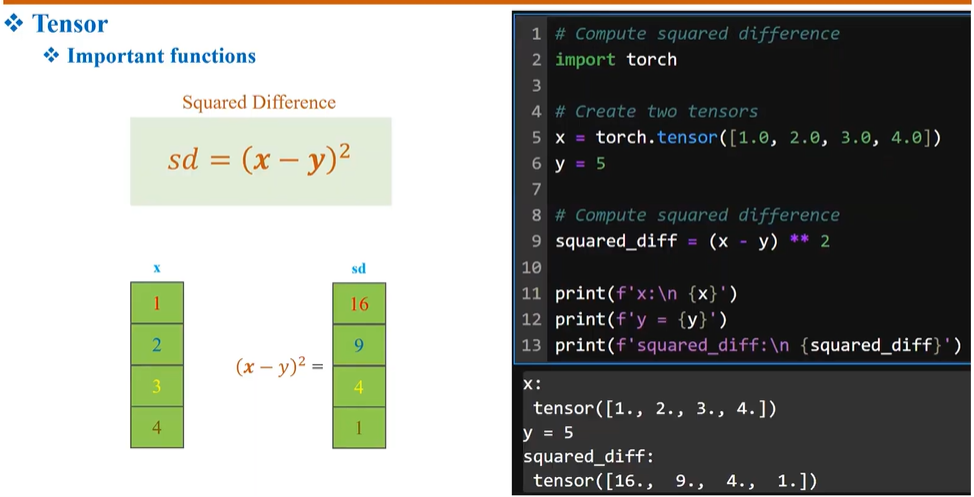

In [5]:
x = torch.tensor([1.0, 2.0, 3.0, 4.0])
y = 5

squared_diff = (x - y) ** 2
print(squared_diff) 

tensor([16.,  9.,  4.,  1.])


In [6]:
x = torch.tensor([1.0, 2.0, 3.0, 4.0])
y = torch.tensor([5.0, 5.0, 5.0, 5.0])

# Compute squared difference
loss_fn = torch.nn.MSELoss()
mse = loss_fn(x, y)

print(f'mse: {mse}')

mse: 7.5


In [7]:
# Concatenate tensors 
x = torch.tensor([[1, 2],
                  [3, 4]])
y = torch.tensor([[3, 4],
                  [5, 6]])

# Concat tensors along the first dim (0. Chiều từ trên xuống)
tensor1 = torch.cat((x, y), dim=0)
print(f'Tensor1:\n {tensor1}')

# Concat tensors along the second dim (1. Chiều từ trái sang phải)
tensor2 = torch.cat((x, y), dim=1)
print(f'Tensor2:\n {tensor2}')

Tensor1:
 tensor([[1, 2],
        [3, 4],
        [3, 4],
        [5, 6]])
Tensor2:
 tensor([[1, 2, 3, 4],
        [3, 4, 5, 6]])


In [8]:
# argmax

# Create a 3x2 tensor
data = torch.randint(low=0, high=9, size=(3, 2))
print(f'data:\n {data}')

# Compute argmax across the rows (dimension 0)
argmax_dim0 = torch.argmax(data, dim=0)
print(f'argmax0:\n {argmax_dim0}')

# Compute argmax across the columns (dimension 1)
argmax_dim1 = torch.argmax(data, dim=1)
print(f'argmax1:\n {argmax_dim1}') 

data:
 tensor([[0, 0],
        [1, 7],
        [2, 3]])
argmax0:
 tensor([2, 1])
argmax1:
 tensor([0, 1, 1])


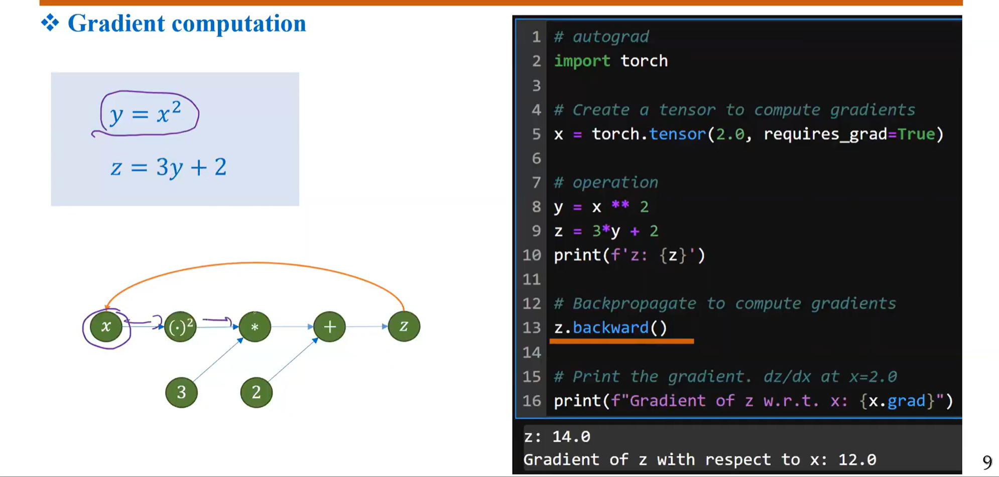

In [9]:
# Gradient computation

# Create a tensor to compute gradients
x = torch.tensor(2.0, requires_grad=True)

# operation
y = x ** 2
z = 3*y + 2
print(f'z: {z}')

# Backpropagate to compute gradients
z.backward()

print(f'Gradient of z w.r.t x: {x.grad}')

z: 14.0
Gradient of z w.r.t x: 12.0


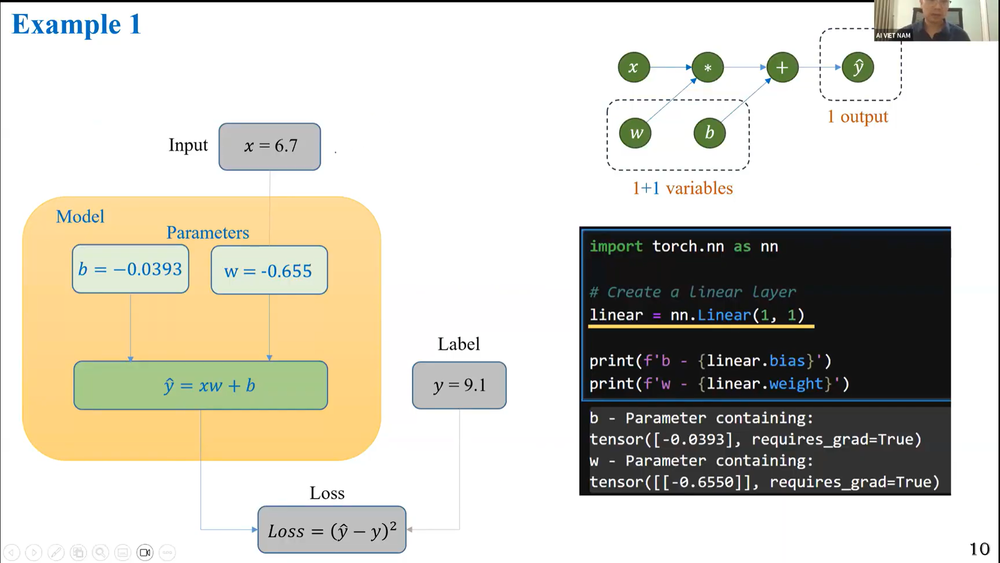

In [10]:
import torch.nn as nn

linear = nn.Linear(1, 1)

print(f'b - {linear.bias}')
print(f'w - {linear.weight}')

b - Parameter containing:
tensor([0.5455], requires_grad=True)
w - Parameter containing:
tensor([[-0.7058]], requires_grad=True)


In [11]:
linear = nn.Linear(1, 1)

# Set values
linear.bias.data = torch.tensor([0.04])
linear.weight.data = torch.tensor([[-0.34]])

print(f'b - {linear.bias}')
print(f'w - {linear.weight}')

b - Parameter containing:
tensor([0.0400], requires_grad=True)
w - Parameter containing:
tensor([[-0.3400]], requires_grad=True)


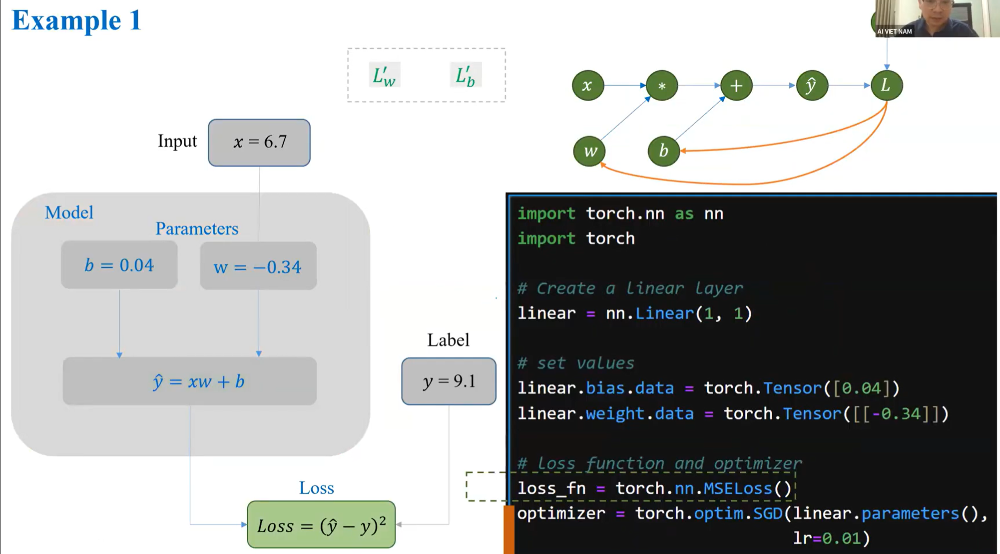

In [12]:
linear = nn.Linear(1, 1)

# Loss function and optimizer
loss_fn = torch.nn.MSELoss()
optimizer = torch.optim.SGD(linear.parameters(), lr=0.01)

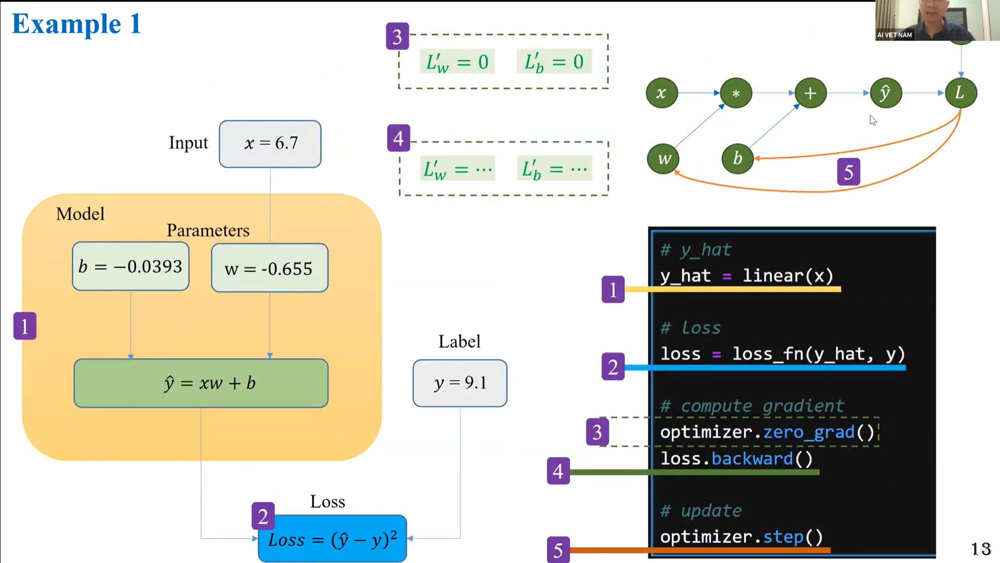

In [13]:
# y_hat 
x = torch.tensor([0.67])
y = torch.tensor([9.1])
y_hat = linear(x)

# loss
loss = loss_fn(y_hat, y)

# Compute gradient
# Xóa sạch các giá trị đạo hàm (gradient) từ bước tính toán trước đó. 
# Nếu không có lệnh này, PyTorch sẽ cộng dồn các gradient lại với nhau gây sai lệch.
optimizer.zero_grad()
loss.backward()

# Update
optimizer.step()

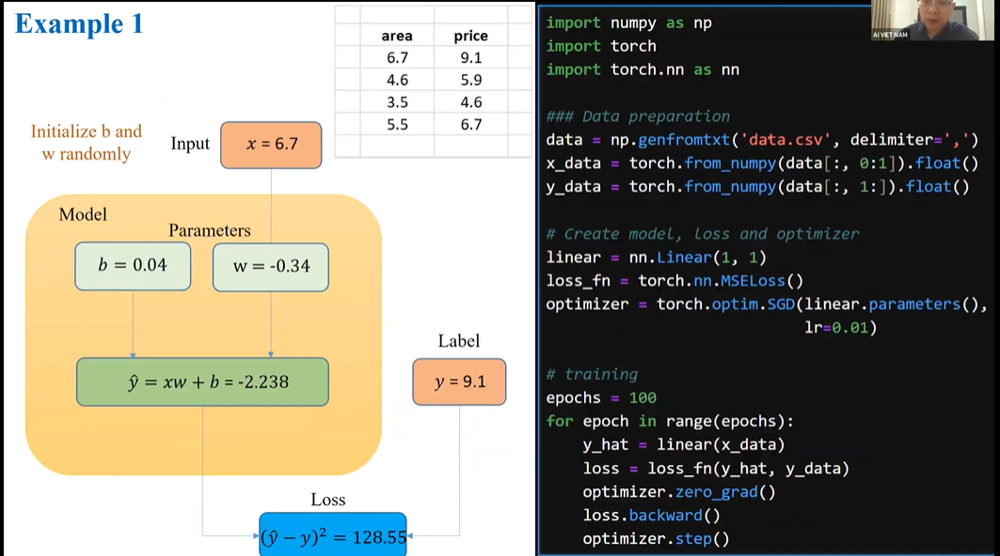

In [14]:
import torch
import torch.nn as nn
import numpy as np

x = np.array([[6.7],[4.6],
              [3.5],[5.5]])
y = np.array([[9.1], [5.9],
              [3.5],[5.5]])

x_data = torch.from_numpy(x).float()
y_data = torch.from_numpy(y).float()

# Create model, loss and optimizer
linear = nn.Linear(1, 1)
loss_fn = torch.nn.MSELoss()
optimizer = torch.optim.SGD(linear.parameters(), lr=0.01)

# Training
epochs = 100
for epoch in range(epochs):
    y_hat = linear(x_data)
    loss = loss_fn(y_hat, y_data)
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

    if (epoch + 1) % 20 == 0:
        print(f'Epoch [{epoch+1}/{epochs}], Loss: {loss.item():.4f}')


Epoch [20/100], Loss: 0.6374
Epoch [40/100], Loss: 0.6329
Epoch [60/100], Loss: 0.6285
Epoch [80/100], Loss: 0.6243
Epoch [100/100], Loss: 0.6203


# Logistic Regression

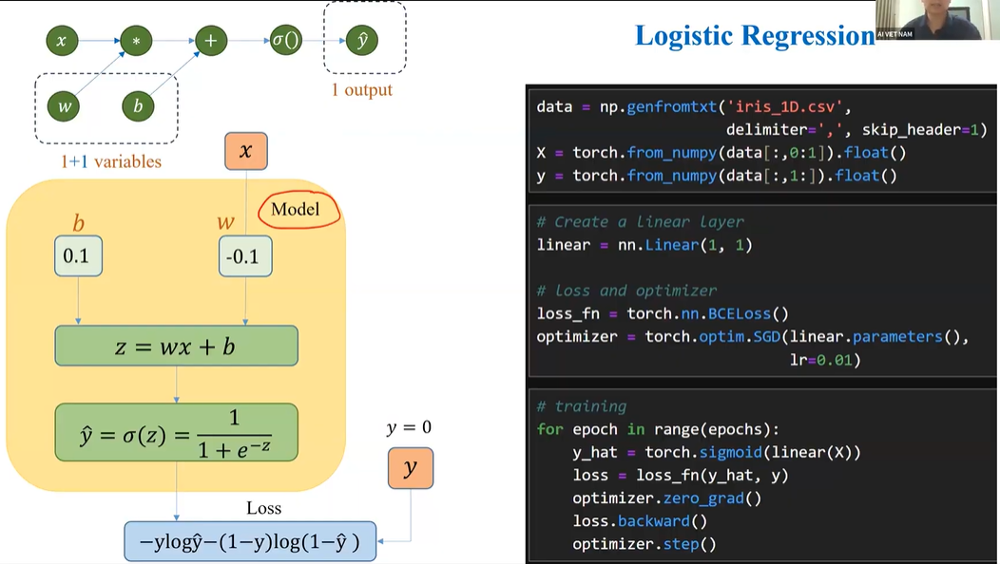

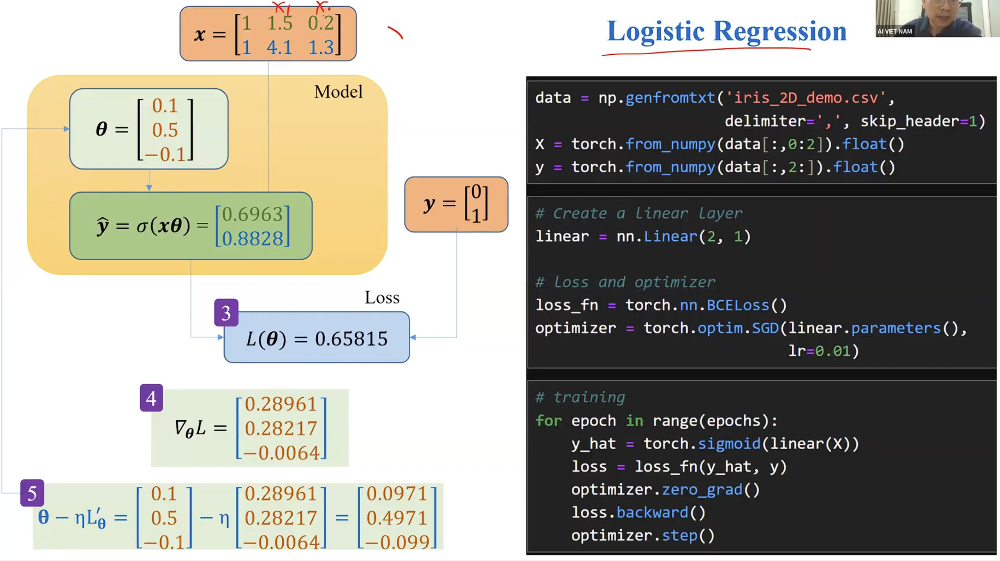



In [15]:
x_data = np.array([
    [1.5, 0.2],
    [4.1, 1.3]
])
y_data = np.array([
    [0], [1]
])

X = torch.from_numpy(x_data).float()
y = torch.from_numpy(y_data).float()

# Create a linear layer
linear = nn.Linear(2, 1)
optimizer = torch.optim.SGD(linear.parameters(), lr=0.01)
loss_fn = torch.nn.BCELoss()

# Training
epochs = 100
for epoch in range(epochs):
    y_hat = torch.sigmoid(linear(X))
    loss = loss_fn(y_hat, y)
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

    if (epoch + 1) % 20 == 0:
        print(f'Epoch {(epoch+1)/epochs}, Loss: {loss.item():.4f}')

Epoch 0.2, Loss: 1.0179
Epoch 0.4, Loss: 0.6784
Epoch 0.6, Loss: 0.5543
Epoch 0.8, Loss: 0.5090
Epoch 1.0, Loss: 0.4888


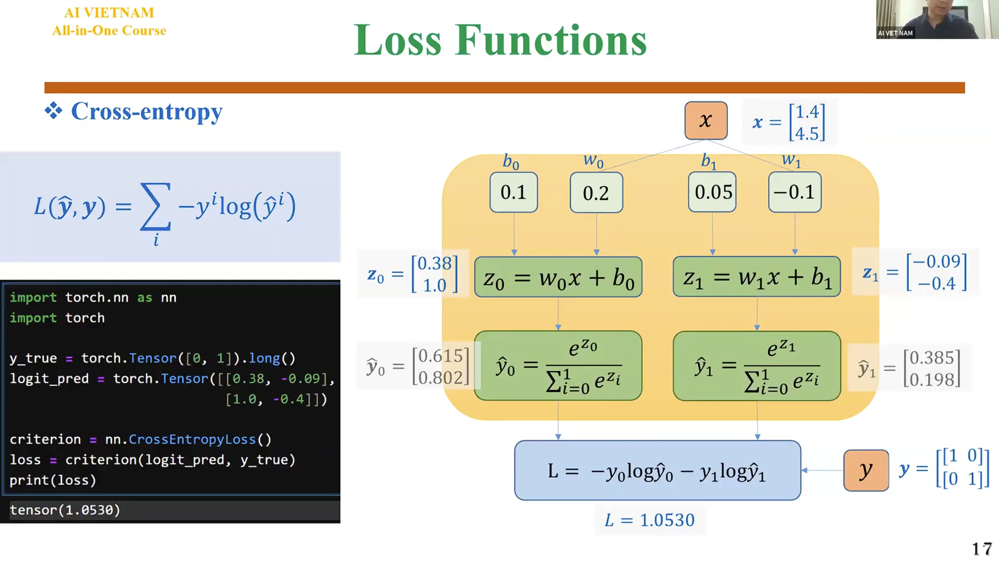

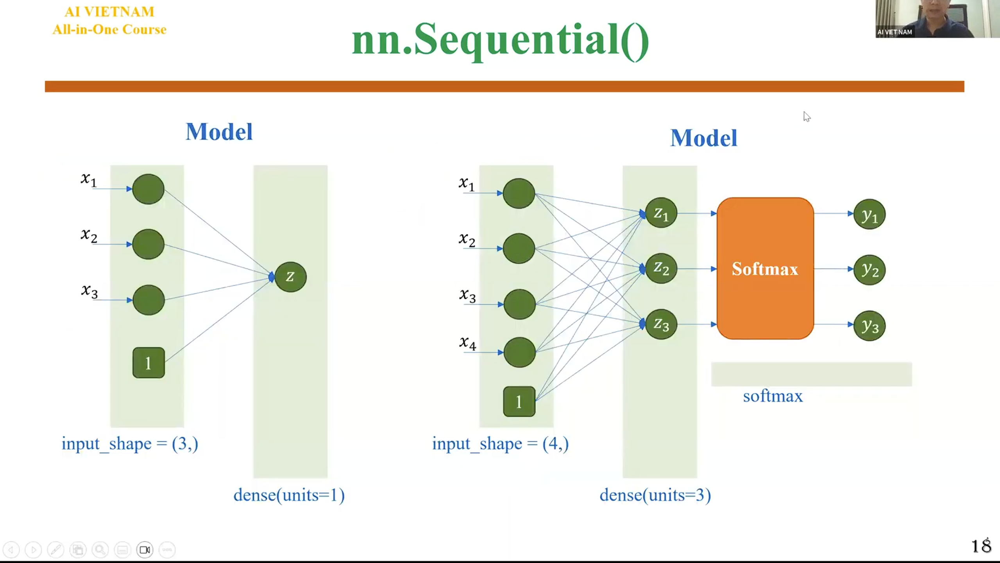

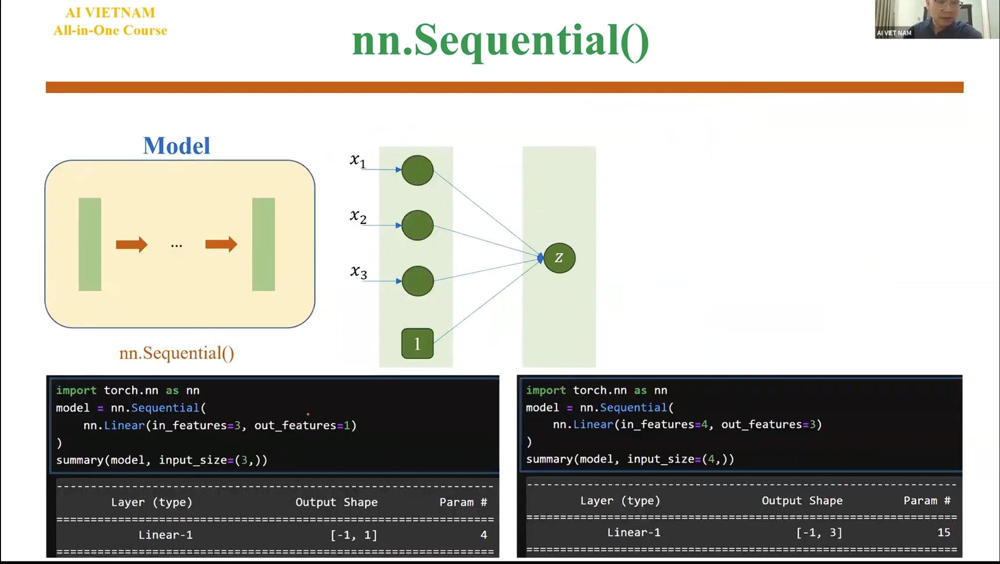



In [ ]:
model = nn.Sequential(
    nn.Linear(in_features=3, out_features=1)
)

# Model construction

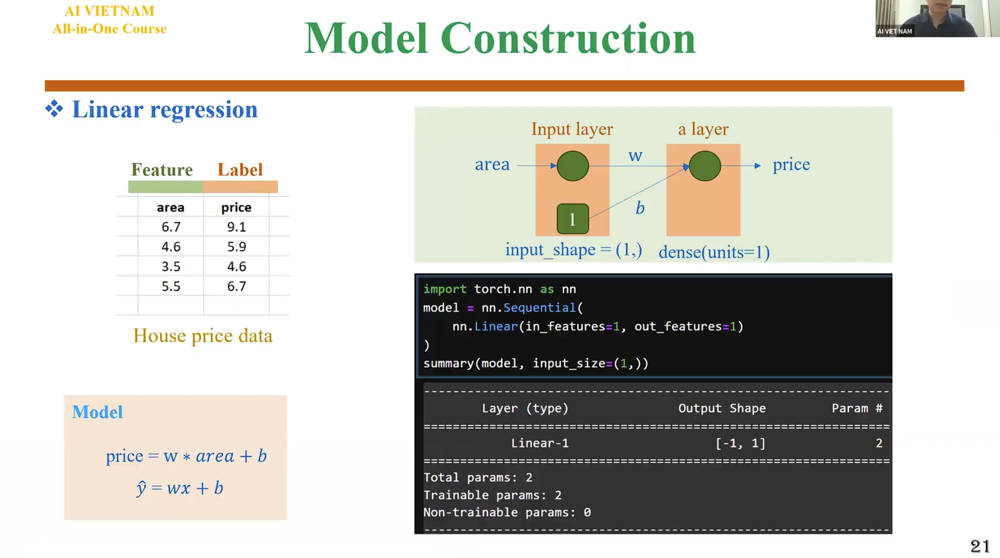

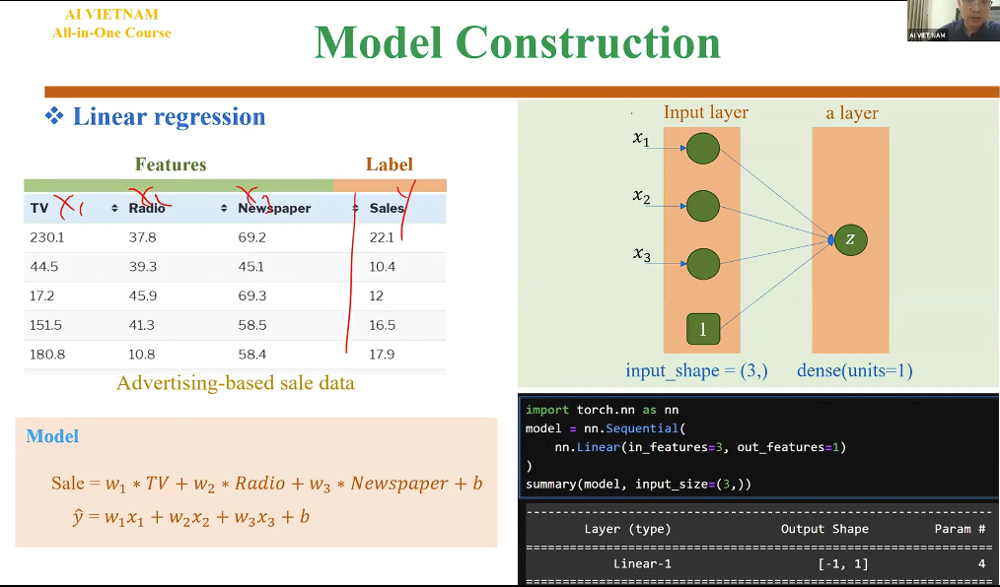

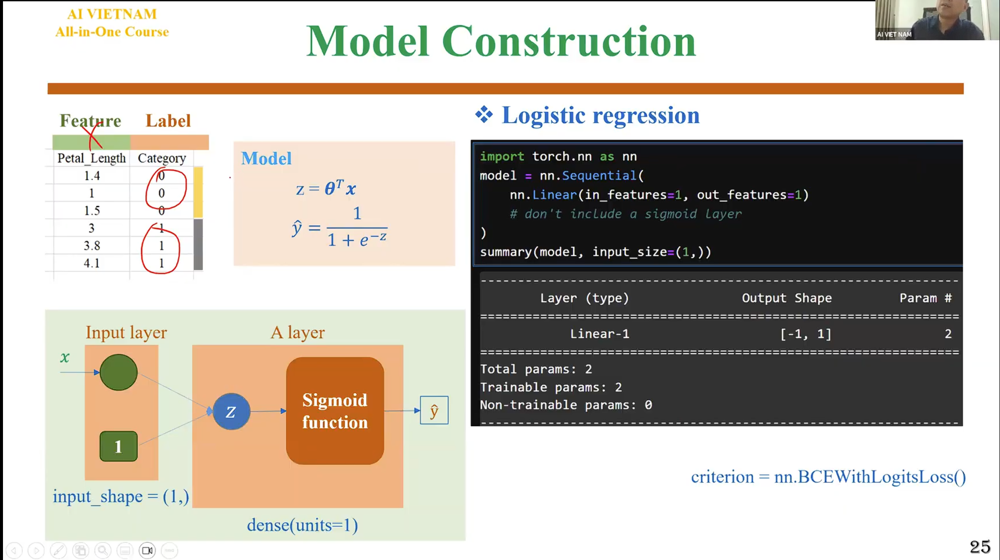

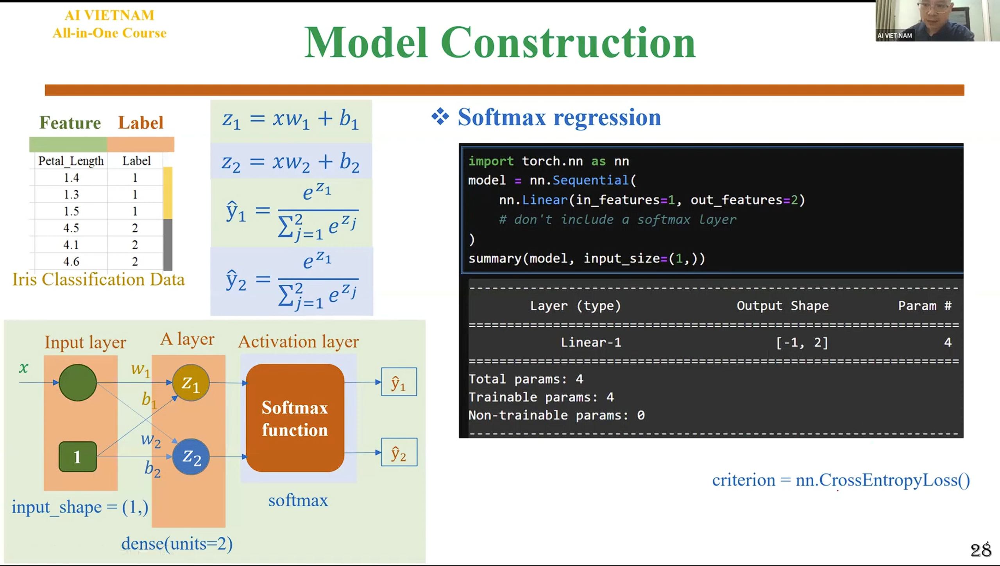



# Training

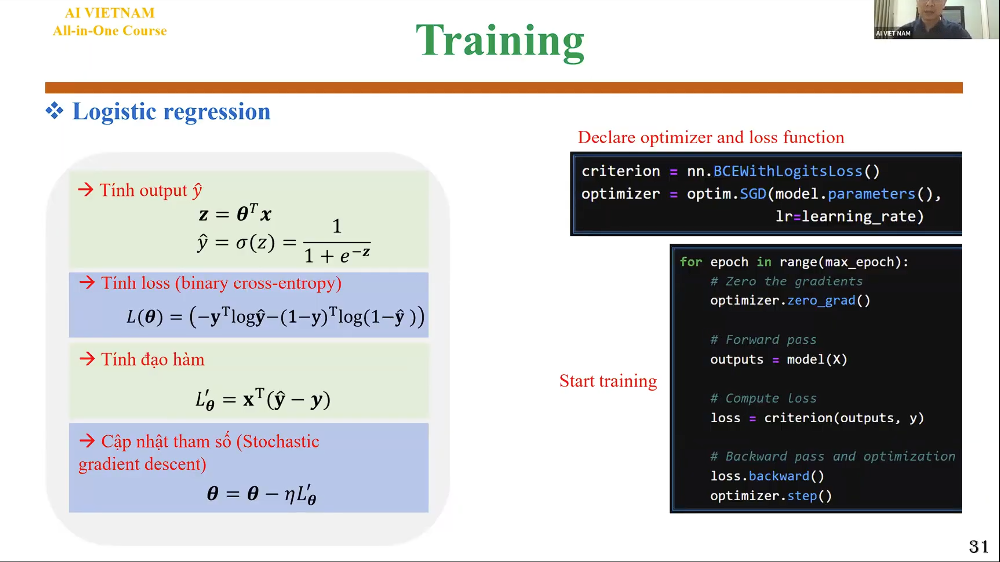